ss1.jpeg

Binarising image...
Done binarising!



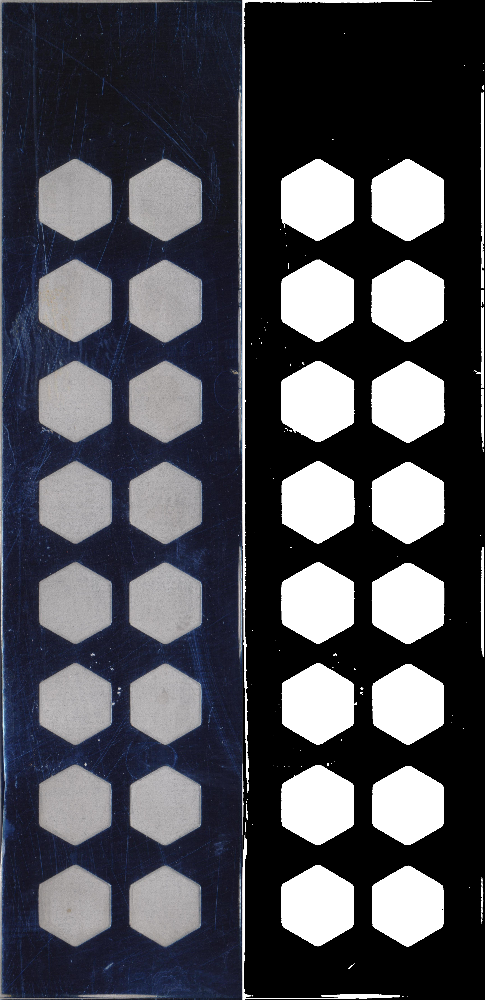

In [0]:
import numpy as np
import cv2
import math
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
#cv2.namedWindow('src',cv2.WINDOW_NORMAL)
#cv2.resizeWindow('src',1200,600)
 
def processImage(inputImage):
    height, width, depth = inputImage.shape
 
    #Creating black image
    blackImg = inputImage.copy()
    blackImg = cv2.cvtColor(blackImg, cv2.COLOR_BGR2GRAY)
    ret, blackImg = cv2.threshold(blackImg, 255, 255, 0)
    blackImg = cv2.cvtColor(blackImg, cv2.COLOR_GRAY2BGR)
 
    #Binary
    binaryImage = inputImage.copy()
    print("Binarising image...")
    binaryImage = cv2.cvtColor(binaryImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(binaryImage,(5,5),0)
    ret3,binaryImage = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    binaryBGRImage = cv2.cvtColor(binaryImage, cv2.COLOR_GRAY2BGR)
    print("Done binarising!"); print()
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
    
    #contours
    contourImage = binaryImage.copy()
    print("Detecting contours...")
    contours, hierarchy =cv2.findContours(contourImage, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contourImage = inputImage.copy()
    cv2.drawContours(contourImage, contours, -1, (0,255,255), 10)
    print("Detected all contours!"); print()
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage, contourImage), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
    
    #contour area
    majorContoursImage = inputImage.copy()
    print("Detecting major contours...")
    i = 0
    lim = len(contours)
    while i<lim:
        if cv2.contourArea(contours[i])<185000 or cv2.contourArea(contours[i])>250000:
            del contours[i]
            i = i-1
            lim = lim-1
        i = i+1
    cv2.drawContours(majorContoursImage, contours, -1, (0,255,255), 20)
    print("Detected major contours! Contours count: "+str(len(contours))); print()
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage, contourImage, majorContoursImage), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
        
    #contour rect
    contoursRectImage = inputImage.copy()
    print("Detecting rectangles...")
    rects = []
    for i in range(len(contours)):
        tx, ty, tw, th = cv2.boundingRect(contours[i])        
        rects.append([tx, ty, tw, th])
        cv2.rectangle(contoursRectImage, (tx, ty), (tx+tw,ty+th), (0,0,255), 20)
    print("Detected rectangles!"); print()
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage, contourImage, majorContoursImage, contoursRectImage), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
 
    #remove background
    print("Removing background...")
    backLess = blackImg.copy()
    backLess2 = blackImg.copy()
    reactedAreaImage = blackImg.copy()
    total = 0
    reacted = 0
    for i in range(len(contours)):
        s_total = 0
        s_reacted = 0
        for j in range(rects[i][1], rects[i][1]+rects[i][3]):
            for k in range(rects[i][0], rects[i][0]+rects[i][2]):
                isInside = cv2.pointPolygonTest(contours[i],(k,j),True)
                if(isInside>=0):
                    backLess[j,k]=inputImage[j,k]
                    reactedAreaImage[j,k]=inputImage[j,k]
                    b = int(backLess[j,k][0])
                    g = int(backLess[j,k][1])
                    r = int(backLess[j,k][2])
                    if math.sqrt((180-b)*(180-b) + (140-g)*(140-g) + (110-r)*(110-r))<=30:
                        backLess2[j,k] = [b, g, r]
                b = int(reactedAreaImage[j,k][0])
                g = int(reactedAreaImage[j,k][1])
                r = int(reactedAreaImage[j,k][2])
                if math.sqrt((170-b)*(170-b) + (170-g)*(170-g) + (170-r)*(170-r))<=50:
                    s_total += 1
                elif math.sqrt((180-b)*(180-b) + (140-g)*(140-g) + (110-r)*(110-r))<=30:
                    s_total += 1
                    s_reacted += 1
                    
        perc = int((s_reacted*100)/s_total)
        total += s_total
        reacted += s_reacted
        cv2.putText(reactedAreaImage, str(perc)+"%", (rects[i][0],rects[i][1]), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 255), 15, cv2.LINE_AA)
    perc = int((reacted*100)/total)
    cv2.putText(reactedAreaImage, str(perc)+"%", (450, 650), cv2.FONT_HERSHEY_SIMPLEX, 12, (0, 255, 255), 35, cv2.LINE_AA)
    print("Background removed!"); print()
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage, contourImage, majorContoursImage, contoursRectImage, backLess), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage, contourImage, majorContoursImage, contoursRectImage, backLess, backLess2), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
    
    finalResultImage = np.concatenate((inputImage, binaryBGRImage, contourImage, majorContoursImage, contoursRectImage, backLess, backLess2, reactedAreaImage), axis=1)
    cv2_imshow(finalResultImage)
    cv2.waitKey(0)
    
    return finalResultImage
 
 
for i in range(1,18):
    print('ss'+str(i)+'.jpeg')
    print()
    resImage = processImage(cv2.imread('ss'+str(i)+'.jpeg'))
    resImage = cv2.resize(resImage, None, fx=0.084, fy=0.084, interpolation = cv2.INTER_CUBIC)
    cv2.imwrite('ss'+str(i)+'_mod.jpeg', resImage)
cv2.destroyAllWindows()